In [1]:
import numpy as np
import networkx as nx
import matplotlib.pylab as plt
import os
import random
import math
import pandas as pd
import scipy
import numpy.ma as ma
import itertools
from networkx.algorithms import bipartite
import community
# from infomap import infomap
import os
import rpy2.robjects as robjects

In [2]:
def ldata(archive):
    f=open(archive)
    data=[]
    for line in f:
        line=line.strip()
        col=line.split()
        data.append(col)
    return data

In [3]:
data_total=ldata('crimen/red_crimenes')
sexos = ldata('crimen/moreno_crime/ent.moreno_crime_crime.person.sex')
nombres = ldata('crimen/moreno_crime/ent.moreno_crime_crime.person.name')
roles = ldata('crimen/moreno_crime/rel.moreno_crime_crime.person.role')

In [5]:
crimenes=[]
personas=[]
red_cr = []
usadosp = []
usadosc = []

for i in data_total:
    if i[1] not in usadosc:
        crimenes.append(i[1]+'cr')
        usadosc.append(i[1])
    if i[0] not in usadosp:
        usadosp.append(i[0])
        personas.append(i[0])
    red_cr.append([i[0],i[1]+'cr']) # En su primer elemento contiene un número que indica a la persona.
                                 # almacenado esto mismo en lista "personas"
                                 # en su segundo elemento un str que contiene al crimen.
                                 # # almacenado esto mismo en lista "crimenes"

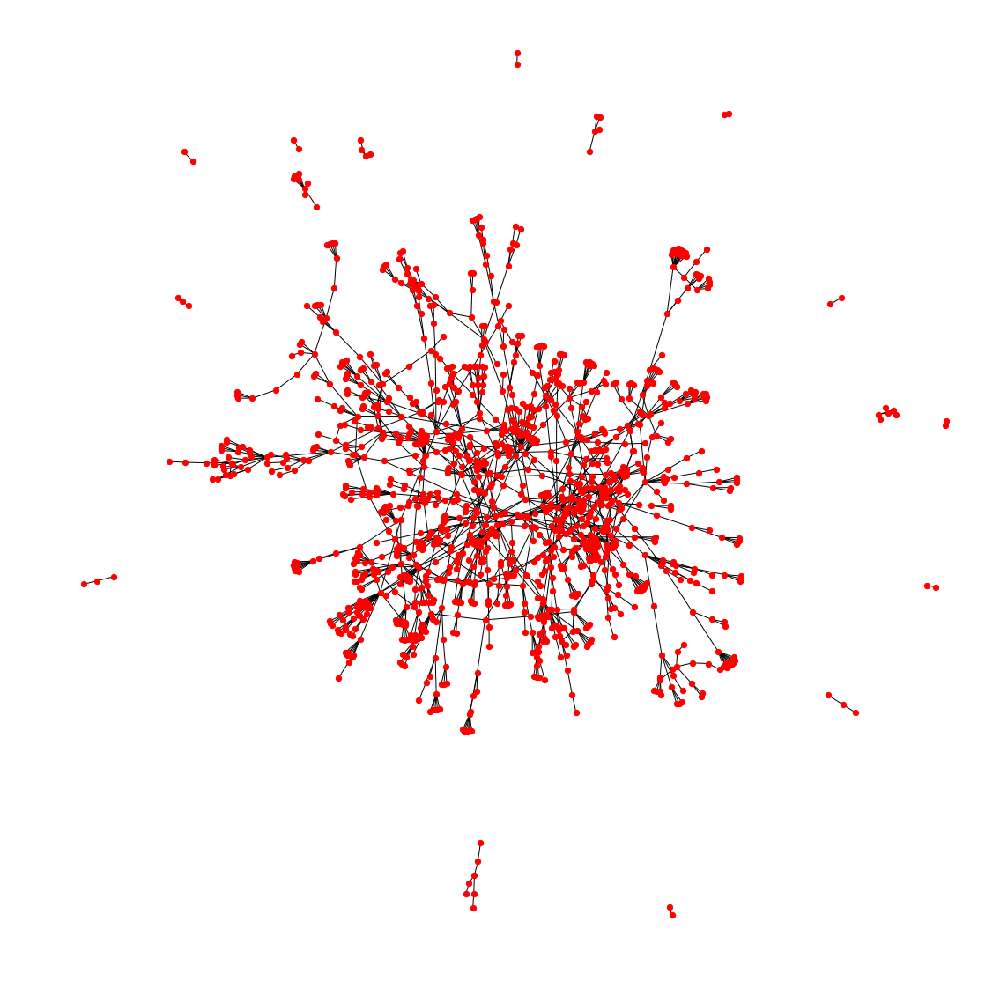

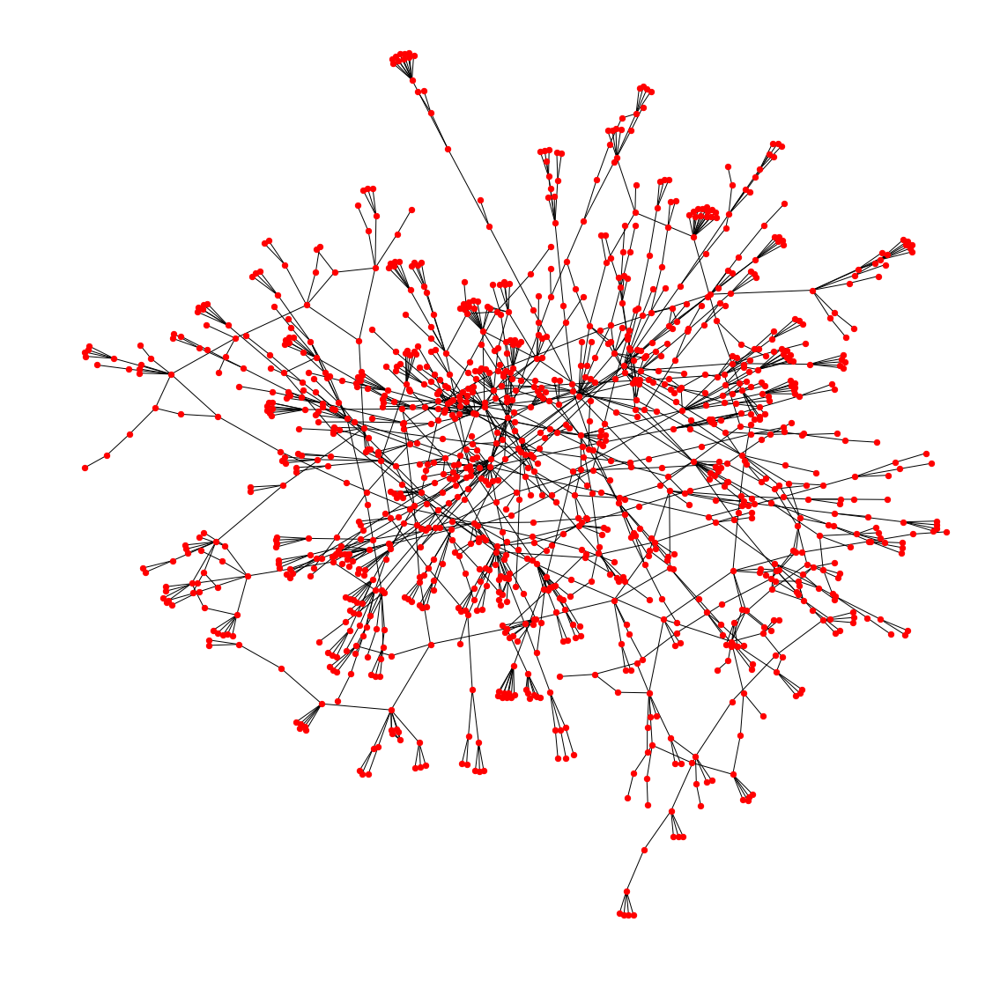

In [6]:
B = nx.Graph()
# Asigna dos valores de bipartición (0 y 1) para cada tipo de nodo (personas, crimenes)
B.add_nodes_from(personas, bipartite=0)
B.add_nodes_from(crimenes, bipartite=1)
# Agrega un enlace entre nodos de biparticiones diferentes.
B.add_edges_from(red_cr)

plt.figure(figsize=(15,15))
nx.draw(B,node_size = 40,with_labels=False, font_weight='bold')
plt.show()

Bmax = max(nx.connected_component_subgraphs(B), key=len)
plt.figure(figsize=(15,15))
nx.draw(Bmax,node_size = 40,with_labels=False, font_weight='bold')
plt.show()

In [8]:
#Asignacion universal de atributos (AUA)
for i in range(2):
    if '1' in bipartite.sets(Bmax)[i]:
        
        for node in bipartite.sets(Bmax)[i]:
            Bmax.node[node]['color']='red'
            Bmax.node[node]['nombre']=nombres[int(node)-1]
            Bmax.node[node]['sexo']=sexos[int(node)-1]
    else:
        for node in bipartite.sets(Bmax)[i]:
            Bmax.node[node]['color']='blue'

for edge in Bmax.edges:
    if [str(edge[0]),str(edge[1])] in red_cr:
        Bmax.edges[edge]['rol']=roles[red_cr.index([str(edge[0]),str(edge[1])])]
    else:
        Bmax.edges[edge]['rol']=roles[red_cr.index([str(edge[1]),str(edge[0])])]

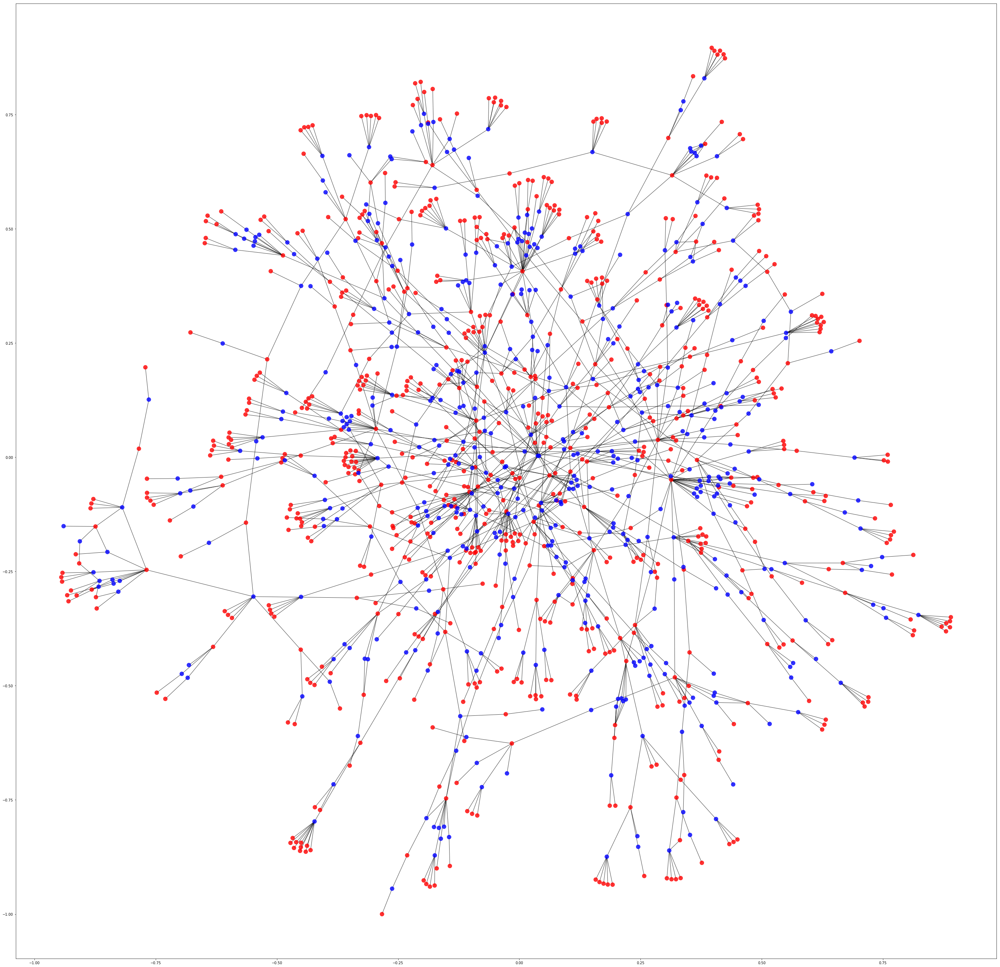

In [26]:
plt.figure(figsize=(50,50))
nx.draw_networkx(Bmax, node_color=list(nx.get_node_attributes(Bmax, "color").values()),
                 node_size=130,
                 width=20,
                 alpha=0.8,
                 with_labels=False)
plt.show()

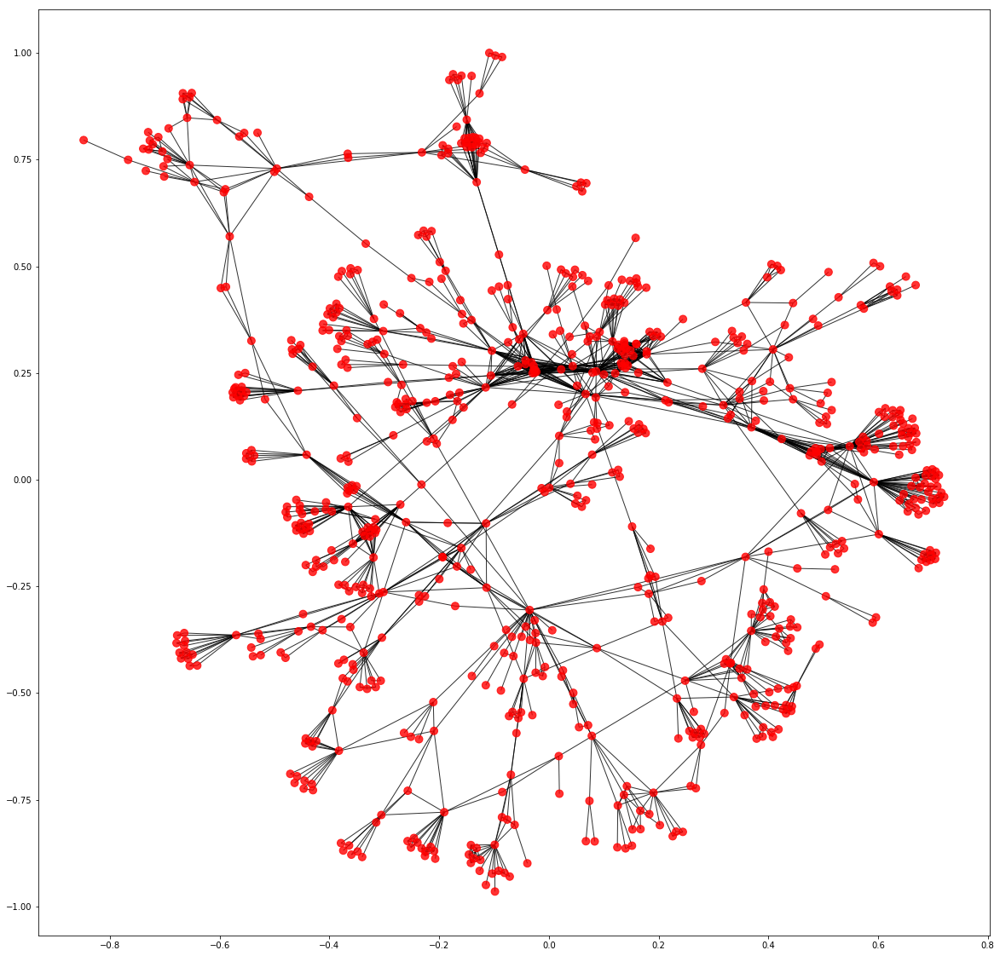

In [10]:
PP = max(nx.connected_component_subgraphs(nx.algorithms.bipartite.projection.weighted_projected_graph(B, personas, ratio=False)), key=len)

for node in PP.nodes:
    if node in personas:
#         print("hola")
        PP.node[node]['color']='red'
        PP.node[node]['nombre']=nombres[int(node)-1]
#         PP.node[node]['rol']=roles[node-1]
        PP.node[node]['sexo']=sexos[int(node)-1]
    elif node in crimenes:
#         print('FUNCIONA!!!')
        PP.node[node]['color']='blue'

plt.figure(figsize=(20,20))
nx.draw_networkx(PP, node_color=list(nx.get_node_attributes(PP, "color").values()),
                 node_size=80,
                 alpha=0.8,
                 with_labels=False)
plt.show()

In [34]:
nx.get_edge_attributes(PP,'weight').keys()

dict_keys([('1', '694'), ('1', '756'), ('1', '93'), ('1', '336'), ('2', '499'), ('2', '361'), ('2', '768'), ('2', '820'), ('2', '578'), ('2', '305'), ('2', '223'), ('2', '620'), ('2', '661'), ('2', '528'), ('2', '48'), ('2', '90'), ('2', '660'), ('2', '439'), ('2', '475'), ('2', '587'), ('2', '563'), ('2', '401'), ('2', '186'), ('2', '4'), ('2', '320'), ('2', '287'), ('2', '665'), ('2', '67'), ('2', '33'), ('2', '495'), ('2', '300'), ('2', '304'), ('2', '773'), ('2', '309'), ('2', '716'), ('2', '360'), ('2', '338'), ('2', '603'), ('2', '782'), ('2', '449'), ('2', '608'), ('2', '806'), ('2', '5'), ('2', '781'), ('2', '690'), ('2', '39'), ('2', '471'), ('2', '710'), ('2', '498'), ('2', '356'), ('2', '286'), ('2', '211'), ('3', '214'), ('4', '781'), ('4', '360'), ('4', '401'), ('4', '286'), ('4', '287'), ('4', '48'), ('5', '499'), ('5', '361'), ('5', '768'), ('5', '820'), ('5', '620'), ('5', '603'), ('6', '647'), ('6', '73'), ('6', '497'), ('6', '97'), ('6', '803'), ('6', '595'), ('6', '1

In [11]:
gradosPP = PP.degree(list(PP.nodes()))
gpersPP=[]
gcrimPP = []
for node in PP.nodes:
    if node in personas:
        gpersPP.append(gradosPP[node])

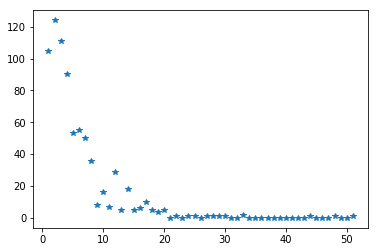

In [12]:
nro=np.linspace(1,max(gpersPP),max(gpersPP))
gradpers=np.zeros(len(nro))

for i in range(len(nro)):
    for g in gpersPP:
        if g==i+1:
            gradpers[i]=gradpers[i]+1
plt.plot(nro,gradpers,'*')
plt.show()

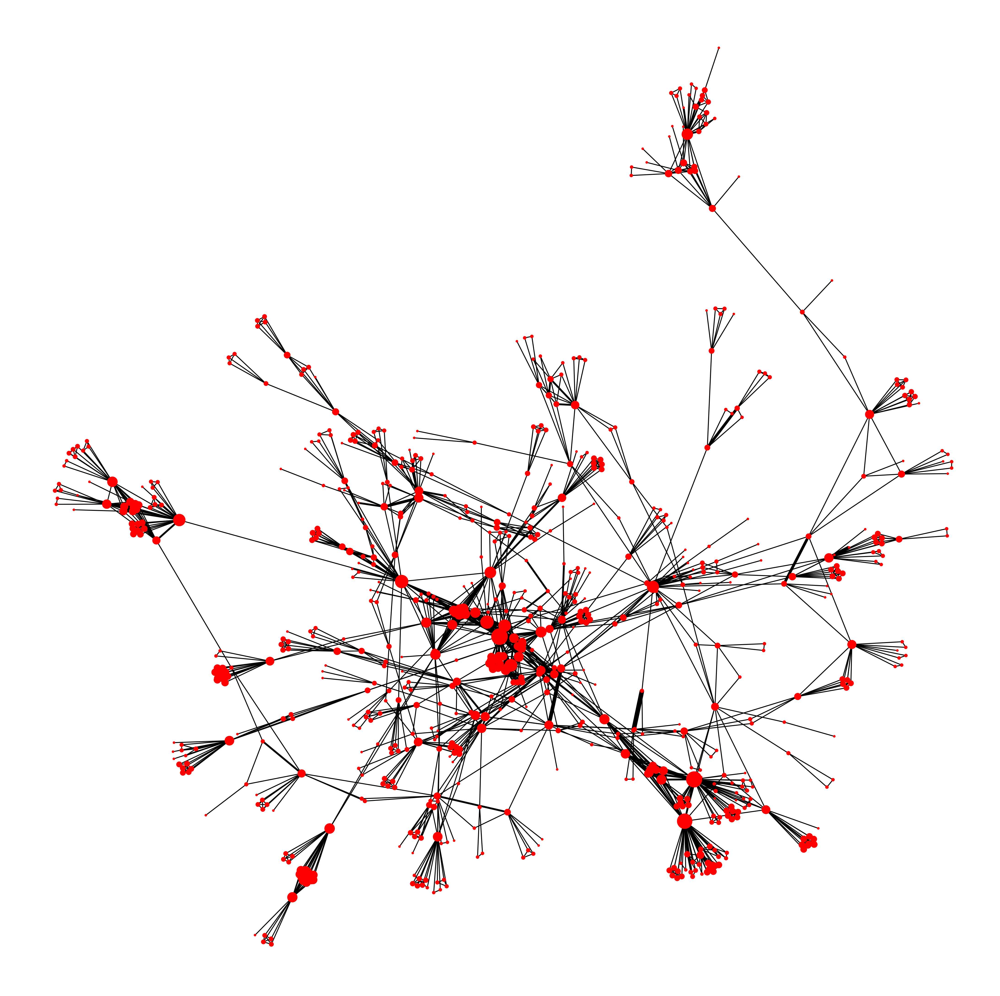

In [43]:
d = dict(nx.degree(PP))
plt.figure(figsize=(60,60))
nx.draw(PP, nodelist=d.keys(), edgelist=list(nx.get_edge_attributes(PP,'weight').keys()), 
        width=[t * 4 for t in nx.get_edge_attributes(PP,'weight').values()], node_size=[v * 100 for v in d.values()])
plt.show()

In [18]:
comunidadesPP = community.best_partition(PP)
mod = community.modularity(comunidadesPP,PP)

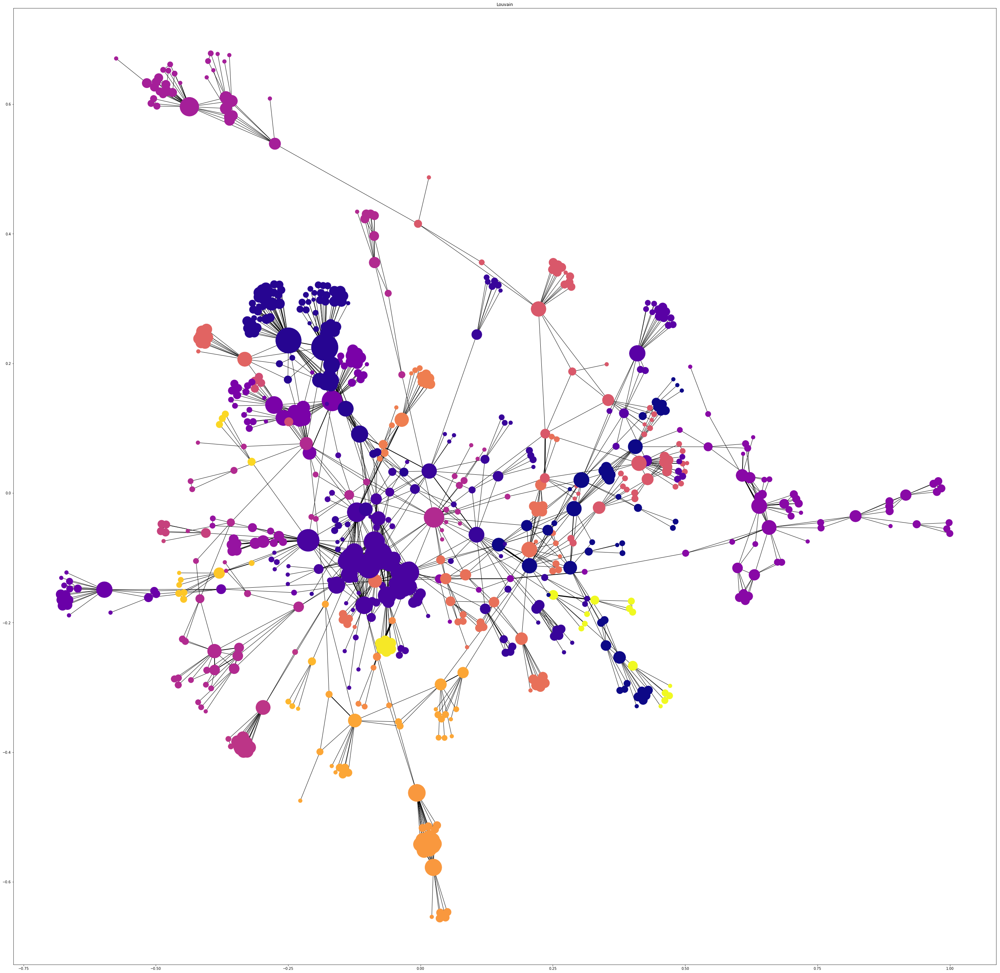

In [62]:
plt.figure(figsize=(50,50))
for name,label in comunidadesPP.items():
    PP.nodes()[name]["color"] = label

nx.draw_networkx(PP, nodelist=d.keys(), node_size=[v * 120 for v in d.values()], cmap=plt.get_cmap('plasma'),
                 node_color=list(nx.get_node_attributes(PP, "color").values()),
                 edgelist=list(nx.get_edge_attributes(PP,'weight').keys()), 
                 width=[t * 1 for t in nx.get_edge_attributes(PP,'weight').values()],
#                  edge_color=['blue' if list(nx.get_edge_attributes(PP,'weight').values())>=5],
                 with_labels=False)
plt.title('Louvain')
# plt.savefig ("Particion_Louvain.png")
plt.show()

[['425', 65], ['2', 55], ['356', 49], ['695', 39], ['56', 37], ['715', 37], ['497', 36], ['10', 30], ['815', 29], ['404', 27], ['74', 26], ['531', 25], ['533', 25], ['54', 24], ['413', 24], ['572', 24], ['128', 23], ['396', 22], ['811', 21], ['343', 20], ['397', 20], ['439', 20], ['37', 19], ['73', 19], ['97', 19], ['114', 19], ['219', 19], ['361', 19], ['659', 19], ['774', 19], ['776', 19], ['514', 18], ['549', 18], ['59', 17], ['220', 17], ['729', 17], ['736', 17], ['743', 17], ['775', 17], ['777', 17], ['778', 17], ['82', 16], ['336', 16], ['563', 16], ['812', 16], ['17', 15], ['62', 15], ['88', 15], ['384', 15], ['681', 15], ['51', 14], ['98', 14], ['106', 14], ['149', 14], ['304', 14], ['305', 14], ['365', 14], ['408', 14], ['473', 14], ['477', 14], ['484', 14], ['487', 14], ['562', 14], ['698', 14], ['699', 14], ['719', 14], ['726', 14], ['748', 14], ['816', 14], ['57', 13], ['115', 13], ['214', 13], ['225', 13], ['291', 13], ['338', 13], ['449', 13], ['637', 13], ['797', 13], ['

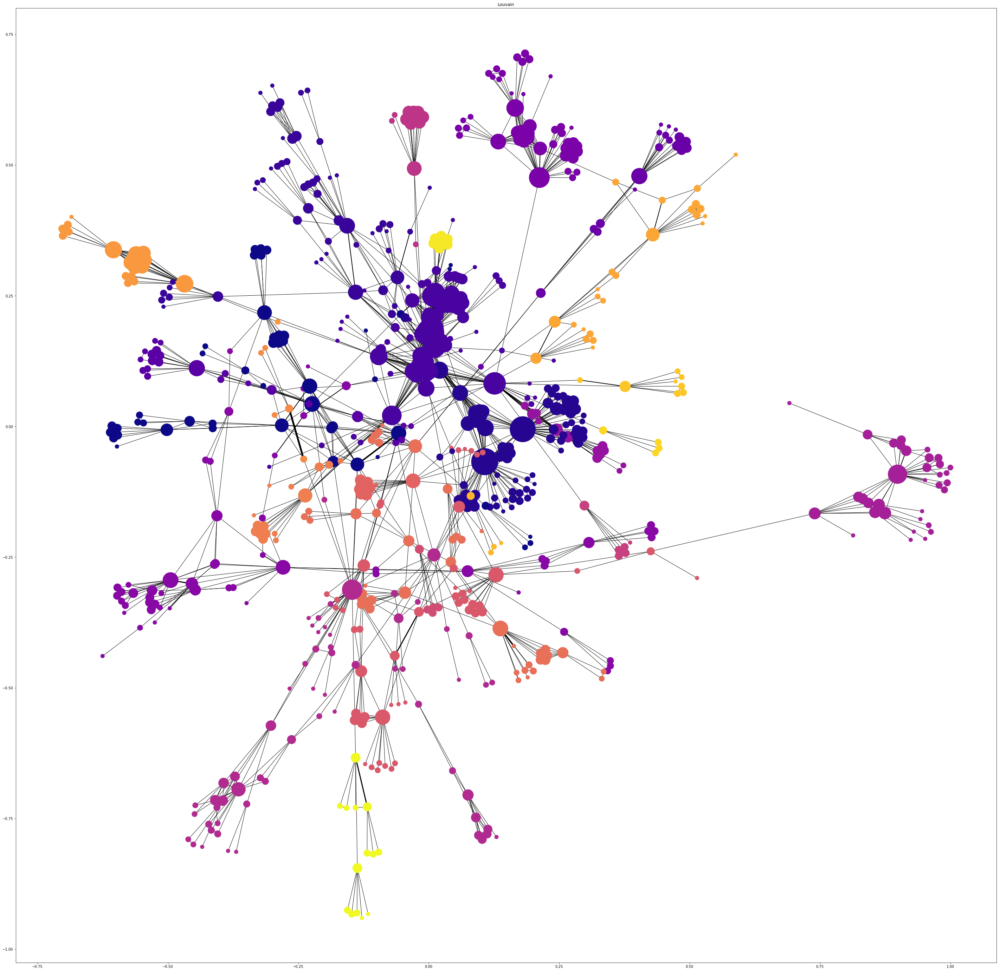

In [85]:
#Busco nodos centrales
#grado PP

centrgradPP = []
for node in PP.nodes:
    centrgradPP.append([node,PP.degree(weight='weight')[node]])
centrgradPP.sort(key=lambda grado: grado[1], reverse=True)
print(centrgradPP)

plt.figure(figsize=(50,50))
for name,label in comunidadesPP.items():
    PP.nodes()[name]["color"] = label

nx.draw_networkx(PP, nodelist=d.keys(), node_size=[v * 120 for v in d.values()], cmap=plt.get_cmap('plasma'),
                 node_color=list(nx.get_node_attributes(PP, "color").values()),
                 edgelist=list(nx.get_edge_attributes(PP,'weight').keys()), 
                 width=[t * 1 for t in nx.get_edge_attributes(PP,'weight').values()],
#                  edge_color=['blue' if list(nx.get_edge_attributes(PP,'weight').values())>=5],
                 with_labels=False)
plt.title('Louvain')
# plt.savefig ("Particion_Louvain.png")
plt.show()

In [ ]:
#grado BIP
centrgradB = []
for i in range(2):
    if '1' in bipartite.sets(Bmax)[i]:
        for node in bipartite.sets(Bmax)[i]:
            centrgradB.append([node,PP.degree[node]])
centrgradB.sort(key=lambda grado: grado[1], reverse=True)            
print(centrgradB) 

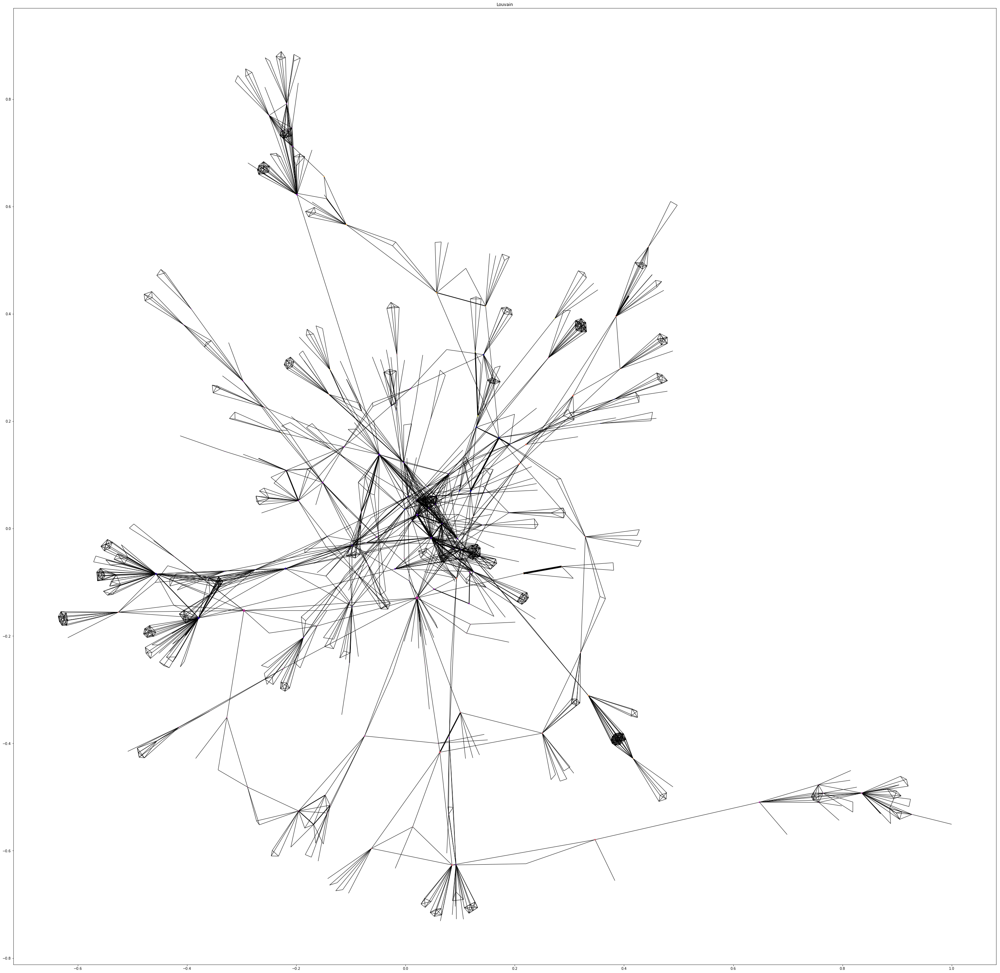

dict_keys(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '90', '91', '92', '93', '95', '96', '97', '98', '99', '100', '101', '102', '103', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '128', '129', '130', '131', '132', '133', '134', '136', '137', '138', '139', '142', '143', '144', '147', '148', '149', '150', '151', '152', '154', '155', '156', '159', '160', '161', '162', '164', '165', '166', '167', '168', '169', '170', '171', '

In [87]:
#Betweenness
centrbet = []
bet = nx.betweenness_centrality(PP)
for node in PP.nodes:
    centrbet.append([node,bet[node]])
centrbet.sort(key=lambda betw: betw[1], reverse=True)
# print(bet)
plt.figure(figsize=(50,50))
for name,label in comunidadesPP.items():
    PP.nodes()[name]["color"] = label
nx.draw_networkx(PP, nodelist=bet.keys(), node_size=[v * 120 for v in bet.values()], cmap=plt.get_cmap('plasma'),
                 node_color=list(nx.get_node_attributes(PP, "color").values()),
                 edgelist=list(nx.get_edge_attributes(PP,'weight').keys()), 
                 width=[t * 1 for t in nx.get_edge_attributes(PP,'weight').values()],
#                  edge_color=['blue' if list(nx.get_edge_attributes(PP,'weight').values())>=5],
                 with_labels=False)
plt.title('Louvain')
# plt.savefig ("Particion_Louvain.png")
plt.show()
bet.keys()

In [70]:
bipartite.sets(Bmax)[0]

{'1',
 '10',
 '100',
 '101',
 '102',
 '103',
 '105',
 '106',
 '107',
 '108',
 '109',
 '11',
 '110',
 '111',
 '112',
 '113',
 '114',
 '115',
 '116',
 '117',
 '118',
 '119',
 '12',
 '120',
 '121',
 '122',
 '123',
 '124',
 '125',
 '126',
 '128',
 '129',
 '13',
 '130',
 '131',
 '132',
 '133',
 '134',
 '136',
 '137',
 '138',
 '139',
 '14',
 '142',
 '143',
 '144',
 '147',
 '148',
 '149',
 '15',
 '150',
 '151',
 '152',
 '154',
 '155',
 '156',
 '159',
 '16',
 '160',
 '161',
 '162',
 '164',
 '165',
 '166',
 '167',
 '168',
 '169',
 '17',
 '170',
 '171',
 '173',
 '174',
 '175',
 '176',
 '177',
 '178',
 '179',
 '18',
 '180',
 '181',
 '183',
 '184',
 '185',
 '186',
 '188',
 '189',
 '19',
 '190',
 '191',
 '192',
 '193',
 '194',
 '195',
 '196',
 '197',
 '199',
 '2',
 '20',
 '200',
 '201',
 '202',
 '203',
 '204',
 '205',
 '207',
 '208',
 '209',
 '21',
 '211',
 '212',
 '213',
 '214',
 '215',
 '216',
 '217',
 '218',
 '219',
 '22',
 '220',
 '221',
 '222',
 '223',
 '224',
 '225',
 '226',
 '227',
 '228',
 